# Import and install necessary packages

In [1]:
!pip install opencv-contrib-python==4.4.0.44

In [2]:
!pip install tqdm

In [119]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random
import skimage.feature
from tqdm import tqdm
from google.colab.patches import cv2_imshow
from sklearn.linear_model import LinearRegression, RANSACRegressor
from skimage.feature import corner_harris, corner_peaks, plot_matches
from skimage import data, io, filters

# Plot Images than need to be stiched



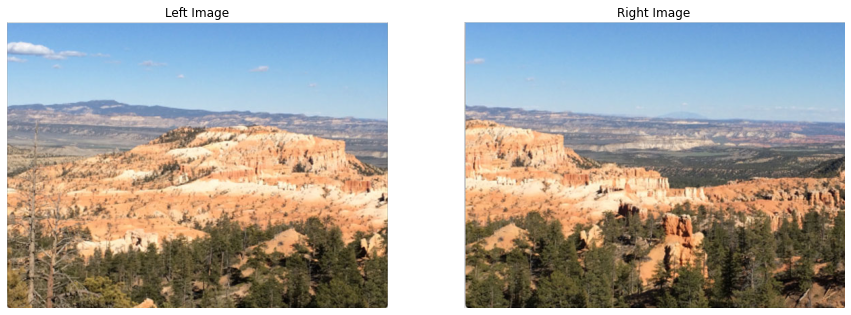

In [129]:
leftImage = cv2.imread("./leftImage.png")
leftImage = cv2.cvtColor(leftImage, cv2.COLOR_BGR2RGB)
rightImage = cv2.imread("./rightImage.png")
rightImage = cv2.cvtColor(rightImage, cv2.COLOR_BGR2RGB)


plt.figure(figsize=(15, 10))

plt.subplot(1, 2, 1)
plt.imshow(leftImage)
plt.title('Left Image')
plt.axis('off')


plt.subplot(1, 2, 2)
plt.imshow(rightImage)
plt.title('Right Image')
plt.axis('off')

plt.show()

# Turn images to gray images

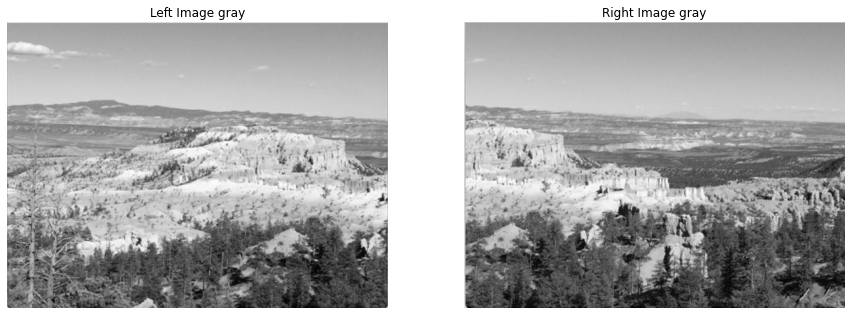

In [5]:
leftImage_gray = cv2.cvtColor(leftImage, cv2.COLOR_RGB2GRAY)
rightImage_gray = cv2.cvtColor(rightImage, cv2.COLOR_RGB2GRAY)


plt.figure(figsize=(15, 10))

plt.subplot(1, 2, 1)
plt.imshow(leftImage_gray, cmap='gray')
plt.title('Left Image gray')
plt.axis('off')


plt.subplot(1, 2, 2)
plt.imshow(rightImage_gray, cmap='gray')
plt.title('Right Image gray')
plt.axis('off')

plt.show()

In [6]:
leftImage_gray.shape

(423, 564)

In [7]:
rightImage_gray.shape

(423, 564)

# Normalize the gray images

In [8]:
upper_bound = 255
lower_bound = 0

normalized_left_image = (leftImage_gray - np.min(leftImage_gray)) * ((upper_bound - lower_bound) / (np.max(leftImage_gray) - np.min(leftImage_gray))) + lower_bound
normalized_right_image = (rightImage_gray - np.min(rightImage_gray)) * ((upper_bound -lower_bound) / (np.max(rightImage_gray) - np.min(rightImage_gray))) + lower_bound

In [9]:
normalized_left_image.shape

(423, 564)

In [10]:
normalized_right_image.shape

(423, 564)

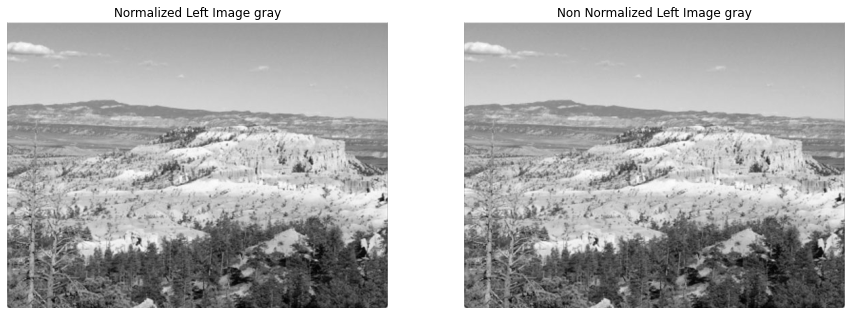

In [11]:
plt.figure(figsize=(15, 10))

plt.subplot(1, 2, 1)
plt.imshow(normalized_left_image, cmap='gray')
plt.title('Normalized Left Image gray')
plt.axis('off')


plt.subplot(1, 2, 2)
plt.imshow(leftImage_gray, cmap='gray')
plt.title('Non Normalized Left Image gray')
plt.axis('off')

plt.show()

# Detect features with corner harris

In [12]:
def detect_features(normalized_left_image,normalized_right_image):

  leftImage_features = corner_peaks(corner_harris(normalized_left_image, method="k", k=0.1, eps=1e-06, sigma=5), min_distance=5, threshold_abs=0.00001, threshold_rel=0.00001)
  rightImage_features = corner_peaks(corner_harris(normalized_right_image, method="k", k=0.1, eps=1e-06, sigma=5), min_distance=1, threshold_abs=0.0001, threshold_rel=0.0001)

  return leftImage_features, rightImage_features

In [13]:
leftImage_features, rightImage_features = detect_features(normalized_left_image,normalized_right_image)

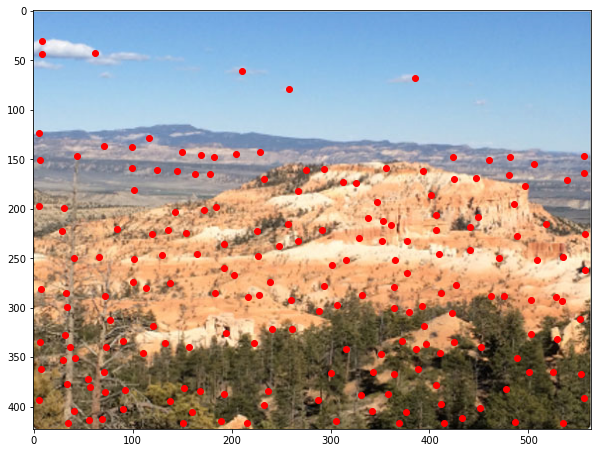

In [14]:
plt.figure(figsize=(10, 10))
plt.imshow(leftImage)
plt.scatter(leftImage_features[:,1],leftImage_features[:,0], c="red")
plt.show()

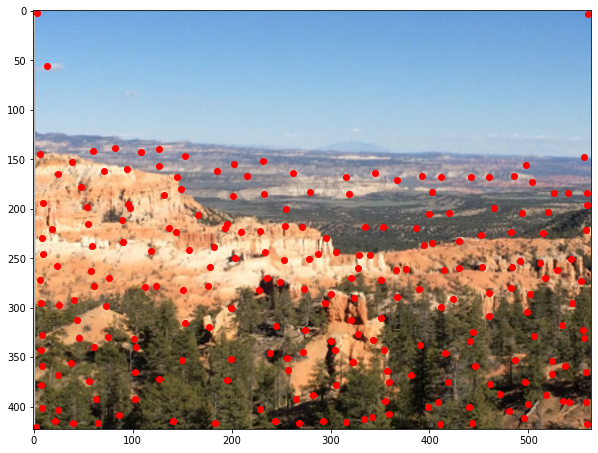

In [15]:
plt.figure(figsize=(10, 10))
plt.imshow(rightImage)
plt.scatter(rightImage_features[:,1],rightImage_features[:,0], c="red")
plt.show()

# Compute descriptors with SIFT

In [16]:
def compute_descriptors(leftImg, rightImg, leftImage_features, rightImage_features):

    sift_harris_left = cv2.xfeatures2d.SIFT_create()
    left_keypoints = [cv2.KeyPoint(float(x[1]), float(x[0]), 1) for x in leftImage_features]
    left_descriptors = [sift_harris_left.compute(leftImg,[kp])[1] for kp in left_keypoints]
    print("# kps: {}, descriptors: {}".format(len(left_keypoints), len(left_descriptors)))


    sift_harris_right = cv2.xfeatures2d.SIFT_create()
    right_keypoints = [cv2.KeyPoint(float(x[1]), float(x[0]), 1) for x in rightImage_features]
    right_descriptors = [sift_harris_right.compute(rightImg,[kp])[1] for kp in right_keypoints]
    print("# kps: {}, descriptors: {}".format(len(right_keypoints), len(right_descriptors)))   

    leftImage_harris_keypoints = cv2.drawKeypoints(leftImage_gray,left_keypoints,leftImg, color=(255,0,0))
    plt.figure(figsize=(10, 10))
    plt.imshow(leftImage_harris_keypoints) 

    rightImage_harris_keypoints = cv2.drawKeypoints(rightImage_gray,right_keypoints,rightImg, color=(255,0,0))
    plt.figure(figsize=(10, 10))
    plt.imshow(rightImage_harris_keypoints)    

    return left_keypoints, left_descriptors, right_keypoints, right_descriptors


# kps: 195, descriptors: 195
# kps: 229, descriptors: 229


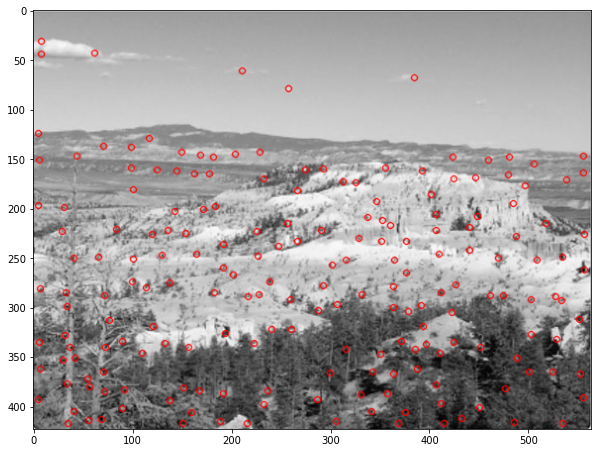

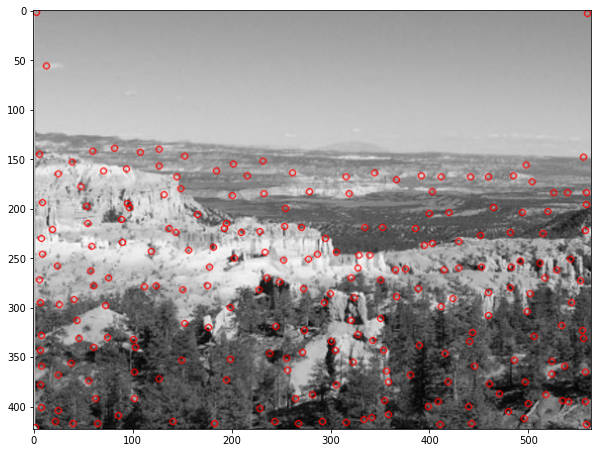

In [17]:
left_keypoints, left_descriptors, right_keypoints, right_descriptors = compute_descriptors(leftImage_gray, rightImage_gray, leftImage_features, rightImage_features)

In [23]:
len(left_descriptors)
# # feature vector

# first element of feature vector
# 128 dimensional vector consisting of the values of the histograms
print(left_descriptors[0])
print(left_descriptors[0].shape)

[[  1.  10.  62.  87.   0.   0.   0.   0.  53. 102.  29.   9.   0.   0.
    0.   0. 124. 117.   0.   0.   0.   0.   0.   0.  56.  99.  22.   0.
    0.   0.   0.   0.   8.   6.  37.  29.   5.   2.   6.  14. 120.  48.
    8.   1.   0.   0.   1.  42. 124.  69.   0.   0.   0.   0.   0.  19.
   49.  83.  29.  10.   0.   0.   0.   1.   3.   0.   0.   0.   4.   5.
  124.  61.  36.   0.   0.   0.   0.   0.  82. 124.  77.   2.   0.   0.
    0.   0.  22. 124.  19.  12.   3.   8.  11.   7.  13.  27.   0.   0.
    0.   0.   0.   1. 124.  65.   0.   0.   0.   0.   0.   0. 124. 118.
    1.   0.   0.   0.   0.   9. 124.  87.   0.   0.   0.   0.   6.  49.
   43.  10.]]
(1, 128)


# Normalize the descriptors

In [24]:
def normalize_descriptors(left_descriptors, right_descriptors):

    # all the decriptors start from zero to 1
    # because each feature is a 128 dimensional vector consisting of the values of the histograms
    # a histogram represents the relative frequency for different gray that occur in the image
    upper_bound_descriptor = 1
    lower_bound_descriptor = 0

    normalized_left_descriptors = (left_descriptors - np.min(left_descriptors)) * ((upper_bound_descriptor - lower_bound_descriptor) / (np.max(left_descriptors) - np.min(left_descriptors))) + lower_bound_descriptor
    normalized_right_descriptors = (right_descriptors - np.min(right_descriptors)) * ((upper_bound_descriptor - lower_bound_descriptor) / (np.max(right_descriptors) - np.min(right_descriptors))) + lower_bound_descriptor

    print(normalized_left_descriptors[0])

    return normalized_left_descriptors, normalized_right_descriptors

In [25]:
normalized_left_descriptors, normalized_right_descriptors = normalize_descriptors(left_descriptors, right_descriptors)

[[0.00595238 0.05952381 0.3690476  0.51785713 0.         0.
  0.         0.         0.3154762  0.60714287 0.17261904 0.05357143
  0.         0.         0.         0.         0.7380952  0.6964286
  0.         0.         0.         0.         0.         0.
  0.33333334 0.58928573 0.13095239 0.         0.         0.
  0.         0.         0.04761905 0.03571429 0.2202381  0.17261904
  0.0297619  0.01190476 0.03571429 0.08333334 0.71428573 0.2857143
  0.04761905 0.00595238 0.         0.         0.00595238 0.25
  0.7380952  0.4107143  0.         0.         0.         0.
  0.         0.11309524 0.2916667  0.49404764 0.17261904 0.05952381
  0.         0.         0.         0.00595238 0.01785714 0.
  0.         0.         0.02380952 0.0297619  0.7380952  0.36309525
  0.21428572 0.         0.         0.         0.         0.
  0.48809525 0.7380952  0.45833334 0.01190476 0.         0.
  0.         0.         0.13095239 0.7380952  0.11309524 0.07142857
  0.01785714 0.04761905 0.06547619 0.0416666

# Compute the Euclidean distance for each descriptor from left and right image

In [26]:
len(normalized_left_descriptors)

distance=np.zeros((len(normalized_left_descriptors), len(normalized_right_descriptors)))
for i in range(len(normalized_left_descriptors)):
    for j in range(len(normalized_right_descriptors)):
        # compute the euclidean distance of the vectors

        # distance = np.linalg.norm(normalized_left_descriptors[i]-normalized_right_descriptors[j])
        distance[i][j] = np.sqrt(np.sum(np.square(normalized_left_descriptors[i]-normalized_right_descriptors[j])))

print(distance)
distance.shape

[[1.15382576 3.38228297 3.2581389  ... 3.51767612 3.58221579 3.57637572]
 [3.19822931 4.26911879 2.75512314 ... 3.54866767 3.74331903 3.80332923]
 [3.76793242 2.38392663 3.90026331 ... 2.87798071 4.14730215 4.01694441]
 ...
 [4.2376442  3.97016668 4.29271936 ... 3.77401614 3.11908722 3.43184066]
 [3.19165301 3.02242088 3.22913241 ... 3.10466766 4.08571482 3.88635802]
 [4.16605425 4.21450853 4.0462532  ... 3.68893981 4.22545719 4.17957592]]


(195, 229)

# Select the best descriptors from the matrix

In [27]:
top_elements = 100

# to find the lowest
indices = np.argpartition(distance, top_elements, axis=None)[:top_elements]
indices_2d = np.column_stack(np.unravel_index(indices, distance.shape))

best_descriptor_values = distance[indices_2d[:,0],indices_2d[:,1]]
best_descriptor_values

array([0.62664181, 0.67603433, 0.69400787, 0.60553592, 0.64615554,
       0.78866243, 0.42848876, 0.60354328, 0.63804412, 0.56757128,
       0.5350194 , 0.88965702, 0.91506124, 0.72041023, 0.63492686,
       0.76778793, 0.84143591, 0.4511261 , 0.33178851, 0.80720079,
       0.70159858, 0.77078158, 0.87118542, 0.92083162, 1.51756525,
       1.28008032, 1.38131154, 1.49605012, 1.08568561, 1.04816008,
       1.25593829, 1.10372949, 1.4379158 , 1.17269456, 1.44707751,
       1.44740808, 1.4871664 , 1.49690259, 1.42097437, 1.15382576,
       1.09730649, 1.5091722 , 1.51278341, 1.42751706, 1.50519931,
       1.18932974, 1.09399188, 1.49864137, 1.51176405, 1.45384383,
       1.20254302, 1.12482679, 1.41368747, 1.5121392 , 1.47374022,
       1.14681852, 1.47609448, 1.35664666, 1.27760065, 1.51167047,
       1.50077939, 1.49148428, 1.26842999, 1.11587691, 1.36304331,
       1.51767039, 1.25277472, 1.17193913, 1.06171191, 1.33855796,
       1.31391311, 1.32979441, 1.20654333, 1.12518895, 1.50289

In [28]:
def find_matched_keypoints(indices_2d, top_elements):

    matches_left = []
    matches_right = []
    for pair in range(top_elements):
        for i,j in indices_2d:
            matches_left.append(list(leftImage_features[i]))
            matches_right.append(list(rightImage_features[j]))

    matches_left = np.array(matches_left)
    matches_right = np.array(matches_right)

    print(matches_left.shape)
    return matches_left, matches_right

# Alternatively, use SIFT to detect and compute keypoints and descriptors

In [130]:
def detect_keypoints_descriptors(img):
    siftDetector= cv2.xfeatures2d.SIFT_create() 
    kp, des = siftDetector.detectAndCompute(img, None)
    return kp, des

In [139]:
def return_img(rgbImage, grayImage, kp):
    tmp = rgbImage.copy()
    image = cv2.drawKeypoints(grayImage, kp, tmp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return image

In [133]:
# Detect keypoints and descriptors
kp_left, des_left = detect_keypoints_descriptors(leftImage_gray)
kp_right, des_right = detect_keypoints_descriptors(rightImage_gray)

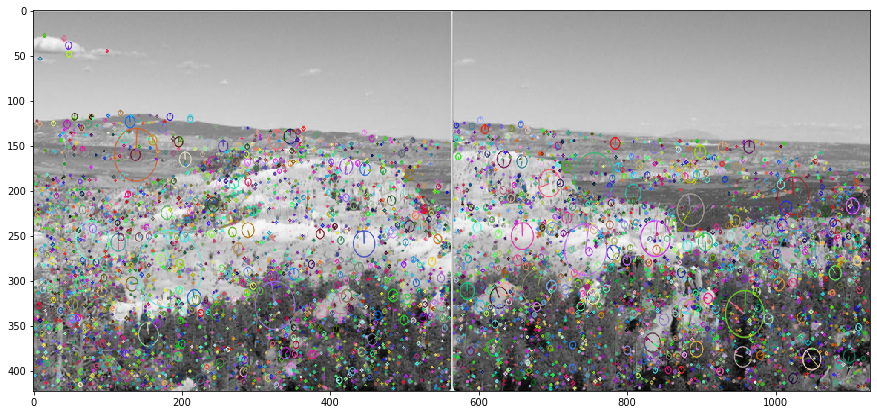

In [134]:
keypoints_left_img = return_img(leftImage, leftImage_gray, kp_left)
keypoints_right_img = return_img(rightImage, rightImage_gray, kp_right)
concatenated_keypoints = np.concatenate((keypoints_left_img, keypoints_right_img), axis=1)

plt.figure(figsize = (15,7))
plt.imshow(concatenated_keypoints, interpolation='nearest', aspect='auto')

In [135]:
def match_keypoints_descriptors(img1, img2, kp1, des1, kp2, des2, threshold):
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1,des2, k=2)

    # Find best matches
    best = []
    for m,n in matches:
        if m.distance < threshold * n.distance:
            best.append([m])

    matches = []
    for pair in best:
        # append to maches list
        matches.append(list(kp1[pair[0].queryIdx].pt + kp2[pair[0].trainIdx].pt))

    # change list to np array
    matches = np.array(matches)
    return matches

In [136]:
matches = match_keypoints_descriptors(leftImage, rightImage, kp_left, des_left, kp_right, des_right, threshold=0.5)

In [137]:
def print_matches(image, matches):
    
    match_img = image.copy()
    constant = image.shape[1]/2
    fig, ax = plt.subplots()

    ax.imshow(np.array(match_img))    
    ax.plot(matches[:, 0], matches[:, 1])
    ax.plot(matches[:, 2] + constant, matches[:, 3])     
    ax.plot([matches[:, 0], matches[:, 2] + constant], [matches[:, 1], matches[:, 3]], linewidth=0.4)

    plt.figure(figsize=(15, 15))
    plt.show()

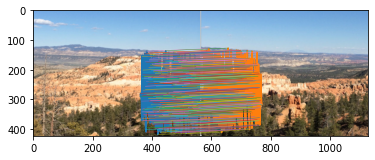

<Figure size 1080x1080 with 0 Axes>

In [138]:
image = np.concatenate((leftImage, rightImage), axis=1)
print_matches(image, matches) 

In [140]:
# find 5 random matches
def random_match(matches, k=5):

    length_of_matches = len(matches)
    index = random.sample(range(length_of_matches), k)
    point = [matches[i] for i in index ]
    numpy_array= np.array(point)

    return numpy_array

In [47]:
def compute_error(points, H):
  
    num_points = len(points)
    all_p1 = np.concatenate((points[:, 0:2], np.ones((num_points, 1))), axis=1)
    all_p2 = points[:, 2:4]
    estimate_p2 = np.zeros((num_points, 2))
    for i in range(num_points):
        temp = np.dot(H, all_p1[i])
        estimate_p2[i] = (temp/temp[2])[0:2] 
    # error computation
    errors = np.linalg.norm(all_p2 - estimate_p2 , axis=1) ** 2

    return errors

In [48]:
def RANSAC(matches, iterations, threshold):
    total_best_inliers = 0    
    for i in range(iterations):
        points = random_match(matches)
        H = transformation_H(points)          
        errors = compute_error(matches, H)
        index = np.where(errors < threshold)[0]
        inliers = matches[index]
        number_inliers = len(inliers)
        if number_inliers > total_best_inliers:
            best_inliers = inliers.copy()
            total_best_inliers = number_inliers
            best_H = H.copy()
            
    print(f"inliers and matches: {total_best_inliers}, {len(matches)}")
    return best_H, best_inliers

In [49]:
# define transformation H
def transformation_H(pairs):
    rows = []
    for i in range(pairs.shape[0]):
        p1 = np.append(pairs[i][0:2], 1)
        p2 = np.append(pairs[i][2:4], 1)
        row1 = [0, 0, 0, p1[0], p1[1], p1[2], -p2[1]*p1[0], -p2[1]*p1[1], -p2[1]*p1[2]]
        row2 = [p1[0], p1[1], p1[2], 0, 0, 0, -p2[0]*p1[0], -p2[0]*p1[1], -p2[0]*p1[2]]
        rows.append(row1)
        rows.append(row2)
    rows = np.array(rows)
    U, s, V = np.linalg.svd(rows)
    H = V[-1].reshape(3, 3)
    H = H/H[2, 2]
    return H

In [50]:
H, inliers = RANSAC(matches, 3000, 0.5)

inliers and matches: 488, 498


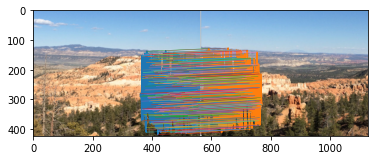

<Figure size 1080x1080 with 0 Axes>

In [51]:
# print the matches RANSAC found
print_matches(image, inliers)

In [52]:
def stitch_img(left, right, H):   
    # Normalize left and right image
    left = cv2.normalize(left.astype('float'), None, 0.0, 1.0, cv2.NORM_MINMAX)   
    right = cv2.normalize(right.astype('float'), None, 0.0, 1.0, cv2.NORM_MINMAX)   
    
    left_height =left.shape[0]
    left_width =left.shape[1]
    # set the corners
    corners = [[0, 0, 1], [left_width, 0, 1], [left_width, left_height, 1], [0, left_height, 1]]
    new_corners = [np.dot(H, corner) for corner in corners]
    new_corners = np.array(new_corners).T 
    new_x = new_corners[0] / new_corners[2]
    new_y = new_corners[1] / new_corners[2]
    y_min = min(new_y)
    x_min = min(new_x)

    matrix_translation = np.array([[1, 0, -x_min], [0, 1, -y_min], [0, 0, 1]])
    H = np.dot(matrix_translation, H)
    
    # Get height, width
    abs_y = abs(y_min)
    abs_x = abs(x_min)
    round_y_height = round(abs_y + left_height)
    round_x_width = round(abs_x + left_width)
    size = (int(round_x_width), int(round_y_height))

    # right image
    left_warped = cv2.warpPerspective(src=left, M=H, dsize=size)
    right_height =right.shape[0]
    right_width =right.shape[1]
    abs_y = abs(y_min)
    abs_x = abs(x_min)
    round_y_height = round(abs_y + right_height)
    round_x_width = round(abs_x + right_width)    
    size = (int(round_x_width), int(round_y_height))
    right_warped = cv2.warpPerspective(src=right, M=matrix_translation, dsize=size)
     
    black = np.zeros(3)
    
    # Stitch
    # code for stiching found in github
    for i in tqdm(range(right_warped.shape[0])):
        for j in range(right_warped.shape[1]):
            left_pixel = left_warped[i, j, :]
            right_pixel = right_warped[i, j, :]
            
            if not np.array_equal(left_pixel, black) and np.array_equal(right_pixel, black):
                left_warped[i, j, :] = left_pixel
            elif np.array_equal(left_pixel, black) and not np.array_equal(right_pixel, black):
                left_warped[i, j, :] = right_pixel
            elif not np.array_equal(left_pixel, black) and not np.array_equal(right_pixel, black):
                left_warped[i, j, :] = (left_pixel + right_pixel) / 2
            else:
                pass
                  
    stitch_image = left_warped[:right_warped.shape[0], :right_warped.shape[1], :]
    return stitch_image

100%|██████████| 459/459 [00:08<00:00, 57.09it/s]


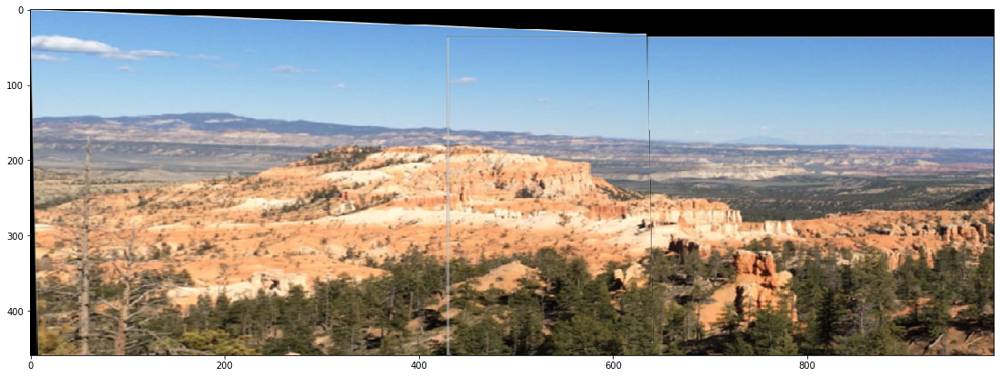

In [53]:
plt.figure(figsize = (19,7))
plt.imshow(stitch_img(leftImage, rightImage, H), interpolation='nearest', aspect='auto')

# Experiment with different values

In [141]:
matches = match_keypoints_descriptors(leftImage, rightImage, kp_left, des_left, kp_right, des_right, threshold=0.1)

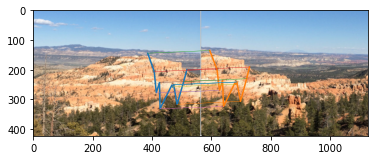

<Figure size 1080x1080 with 0 Axes>

In [142]:
image = np.concatenate((leftImage, rightImage), axis=1)
print_matches(image, matches) 

In [143]:
its = 3000
tres = 0.5
H, inliers = RANSAC(matches, its, tres)

inliers and matches: 12, 12


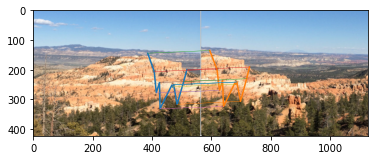

<Figure size 1080x1080 with 0 Axes>

In [144]:
# print the matches RANSAC found
print_matches(image, inliers)

100%|██████████| 460/460 [00:09<00:00, 50.31it/s]


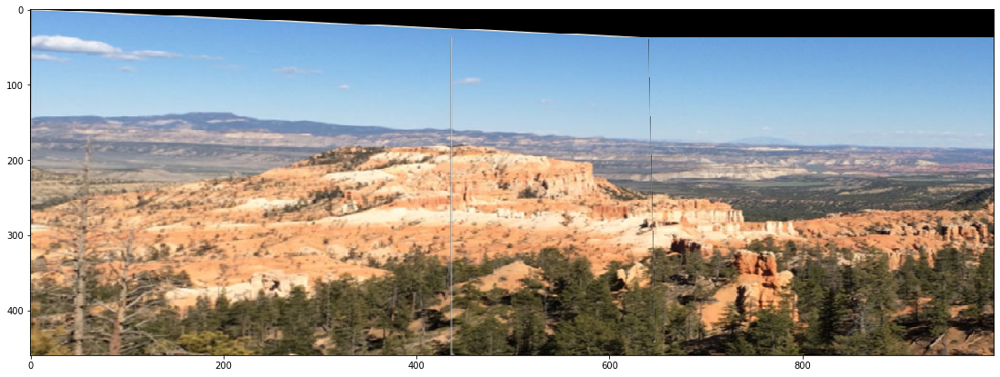

In [145]:
plt.figure(figsize = (19,7))
plt.imshow(stitch_img(leftImage, rightImage, H), interpolation='nearest', aspect='auto')

# Different threshold

In [146]:
its = 3000
tres = 0.1
H, inliers = RANSAC(matches, its, tres)

inliers and matches: 11, 12


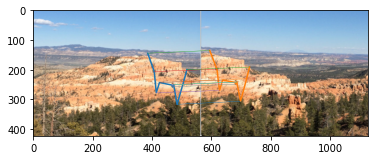

<Figure size 1080x1080 with 0 Axes>

In [147]:
# print the matches RANSAC found
print_matches(image, inliers)

100%|██████████| 455/455 [00:07<00:00, 58.08it/s]


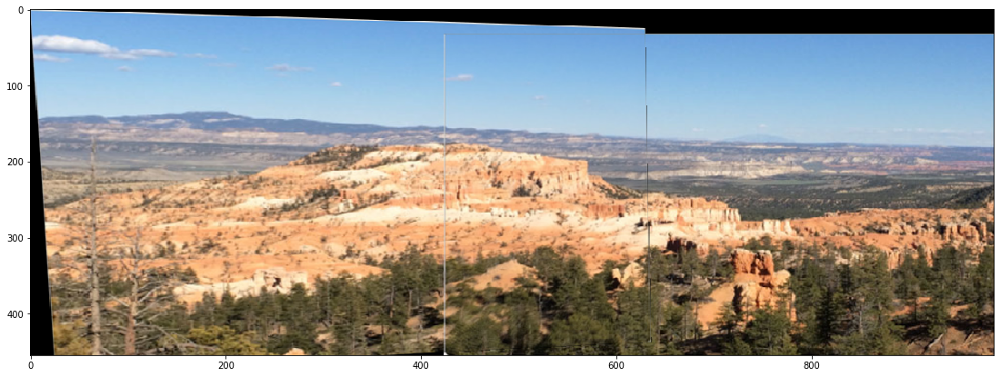

In [148]:
plt.figure(figsize = (19,7))
plt.imshow(stitch_img(leftImage, rightImage, H), interpolation='nearest', aspect='auto')

# Different number of iterations

In [149]:
its = 100
tres = 0.1
H, inliers = RANSAC(matches, its, tres)

inliers and matches: 11, 12


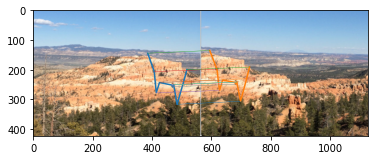

<Figure size 1080x1080 with 0 Axes>

In [150]:
# print the matches RANSAC found
print_matches(image, inliers)

100%|██████████| 456/456 [00:08<00:00, 53.73it/s]


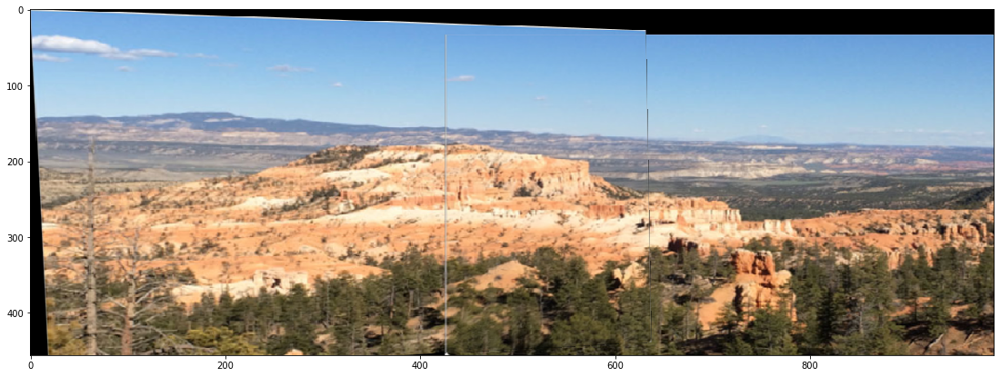

In [151]:
plt.figure(figsize = (19,7))
plt.imshow(stitch_img(leftImage, rightImage, H), interpolation='nearest', aspect='auto')

# Test stitching in difficult case

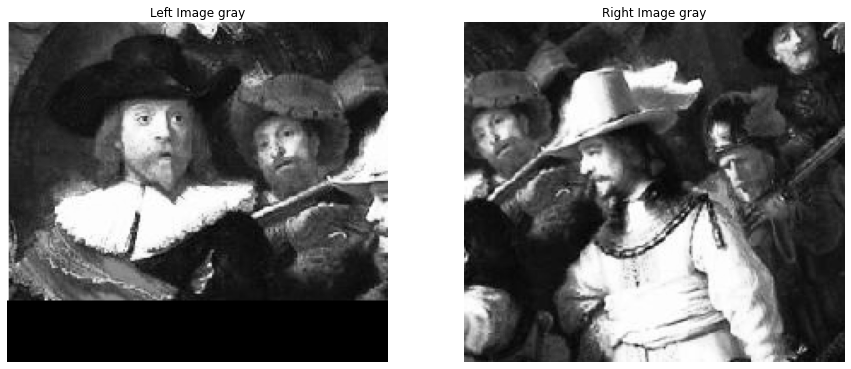

In [81]:
leftImageDifficult = cv2.imread("./difficult_left.png")
leftImageDifficult = cv2.cvtColor(leftImageDifficult, cv2.COLOR_BGR2RGB)
rightImageDifficult = cv2.imread("./difficult_right.png")
rightImageDifficult = cv2.cvtColor(rightImageDifficult, cv2.COLOR_BGR2RGB)

leftImageDifficult.resize(rightImageDifficult.shape, refcheck=False)


leftImageDifficult_gray = cv2.cvtColor(leftImageDifficult, cv2.COLOR_RGB2GRAY)
rightImageDifficult_gray = cv2.cvtColor(rightImageDifficult, cv2.COLOR_RGB2GRAY)

plt.figure(figsize=(15, 10))

plt.subplot(1, 2, 1)
plt.imshow(leftImageDifficult_gray, cmap='gray')
plt.title('Left Image gray')
plt.axis('off')


plt.subplot(1, 2, 2)
plt.imshow(rightImageDifficult_gray, cmap='gray')
plt.title('Right Image gray')
plt.axis('off')

plt.show()

In [82]:
# Detect keypoints and descriptors
kp_left, des_left = detect_keypoints_descriptors(leftImageDifficult_gray)
kp_right, des_right = detect_keypoints_descriptors(rightImageDifficult_gray)

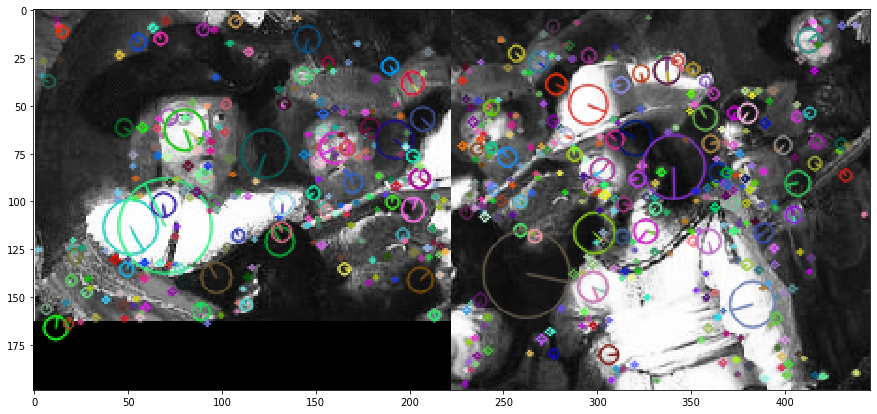

In [83]:
keypoints_left_img = return_img(leftImageDifficult, leftImageDifficult_gray, kp_left)
keypoints_right_img = return_img(rightImageDifficult, rightImageDifficult_gray, kp_right)
keypoints_left_img.resize(keypoints_right_img.shape, refcheck=False)

concatenated_keypoints = np.concatenate((keypoints_left_img, keypoints_right_img), axis=1)

plt.figure(figsize = (15,7))
plt.imshow(concatenated_keypoints, interpolation='nearest', aspect='auto')

In [84]:
matches = match_keypoints_descriptors(leftImageDifficult, rightImageDifficult, kp_left, des_left, kp_right, des_right, threshold=0.5)

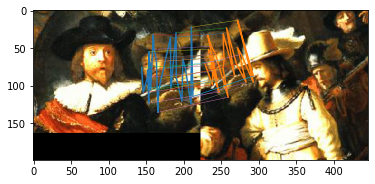

<Figure size 1080x1080 with 0 Axes>

In [85]:
image = np.concatenate((leftImageDifficult, rightImageDifficult), axis=1)
print_matches(image, matches) 

In [86]:
H, inliers = RANSAC(matches, 3000, 0.5)

inliers and matches: 27, 29


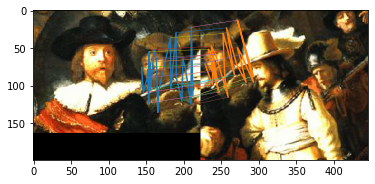

<Figure size 1080x1080 with 0 Axes>

In [87]:
# print the matches RANSAC found
print_matches(image, inliers)

100%|██████████| 208/208 [00:01<00:00, 110.83it/s]


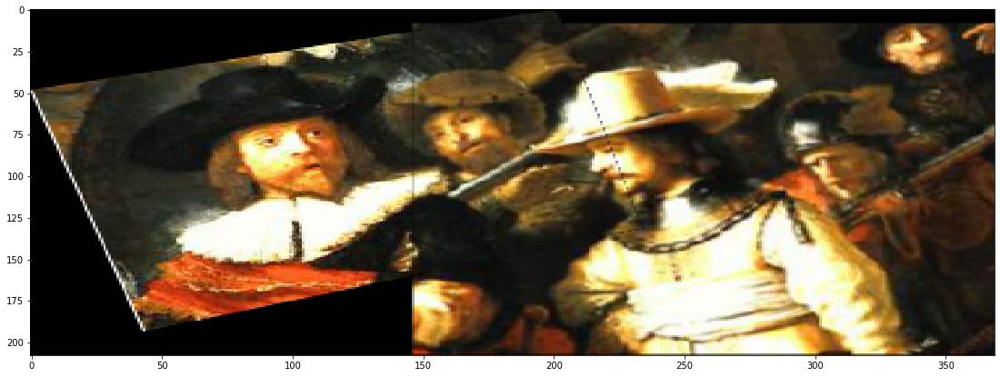

In [89]:
plt.figure(figsize = (19,7))
plt.imshow(stitch_img(leftImageDifficult, rightImageDifficult, H), interpolation='nearest', aspect='auto')

# Detected Keypoints immediately without the use of Harris Corners - Experiment - Only SIFT


In [97]:
sift_left = cv2.xfeatures2d.SIFT_create()

(kps_left, descs_left) = sift_left.detectAndCompute(leftImage_gray, None)
print("# kps: {}, descriptors: {}".format(len(kps_left), descs_left.shape))

# kps: 3489, descriptors: (3489, 128)


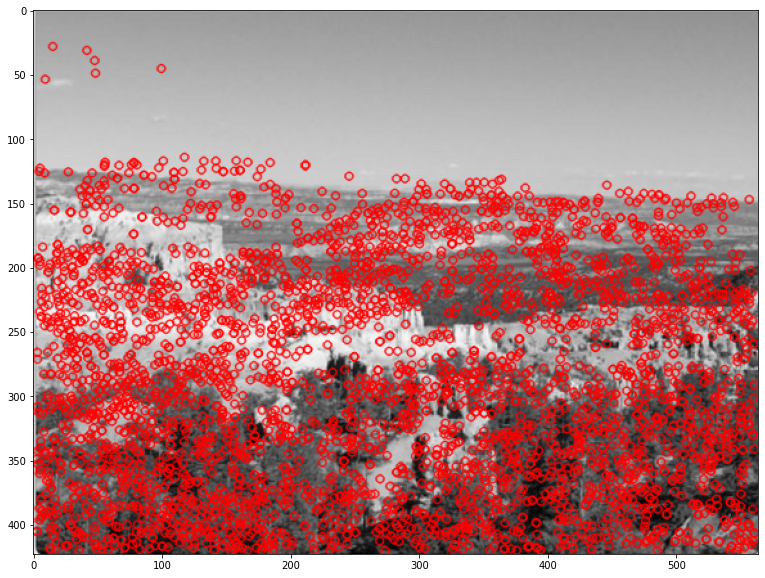

In [98]:
leftImage_keypoints = cv2.drawKeypoints(rightImage_gray,kps_left,rightImage, color=(255,0,0))
plt.figure(figsize=(15, 10))
plt.imshow(leftImage_keypoints)

In [99]:
sift_right = cv2.xfeatures2d.SIFT_create()
(kps_right, descs_right) = sift_right.detectAndCompute(rightImage_gray, None)
print("# kps: {}, descriptors: {}".format(len(kps_right), descs_right.shape))

# kps: 3215, descriptors: (3215, 128)


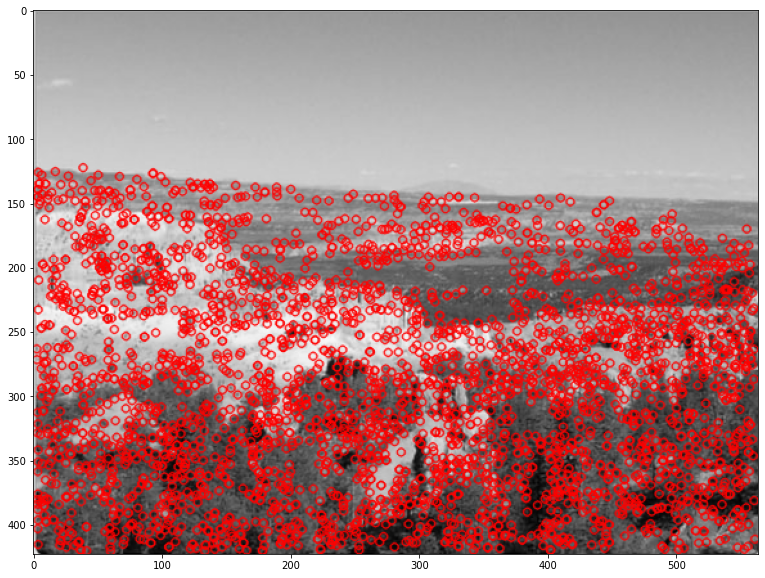

In [100]:
rightImage_keypoints = cv2.drawKeypoints(rightImage_gray,kps_right,rightImage, color=(255,0,0))
plt.figure(figsize=(15, 10))
plt.imshow(rightImage_keypoints)